# Сверткалық нейрондық желілер (CNN). Week 15
Архитектура, conv қабаттар, активация функциялары, pooling, dropout, batch normalization, трансферлік оқыту, кескінді классификациялау



### Addition 
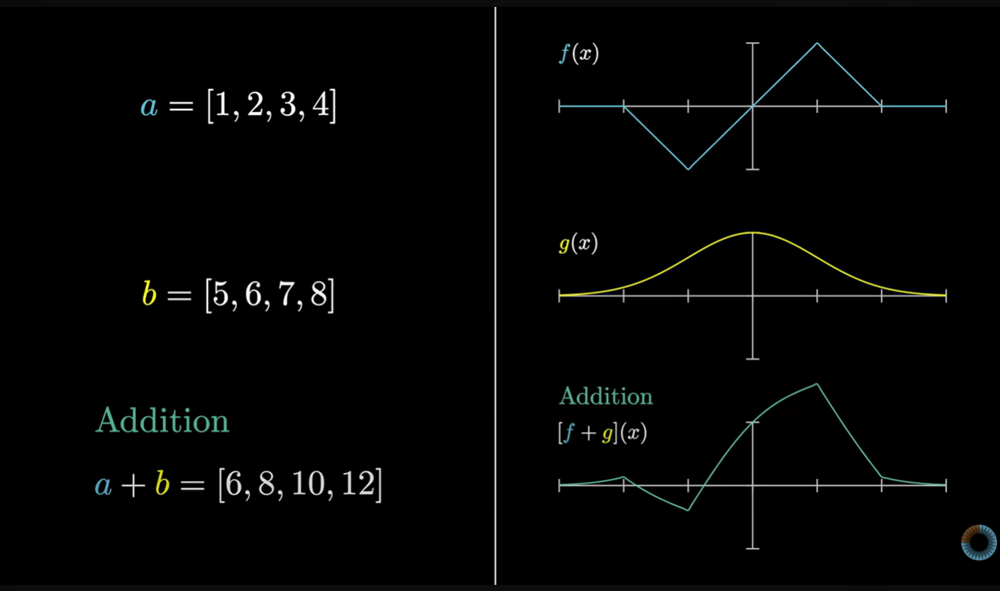

### Multiplication
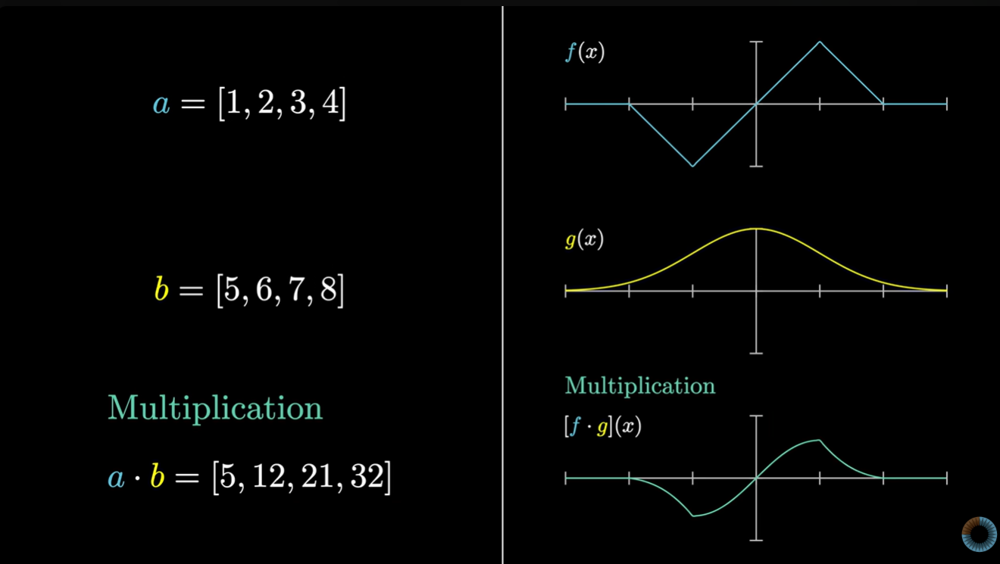

### Convolution
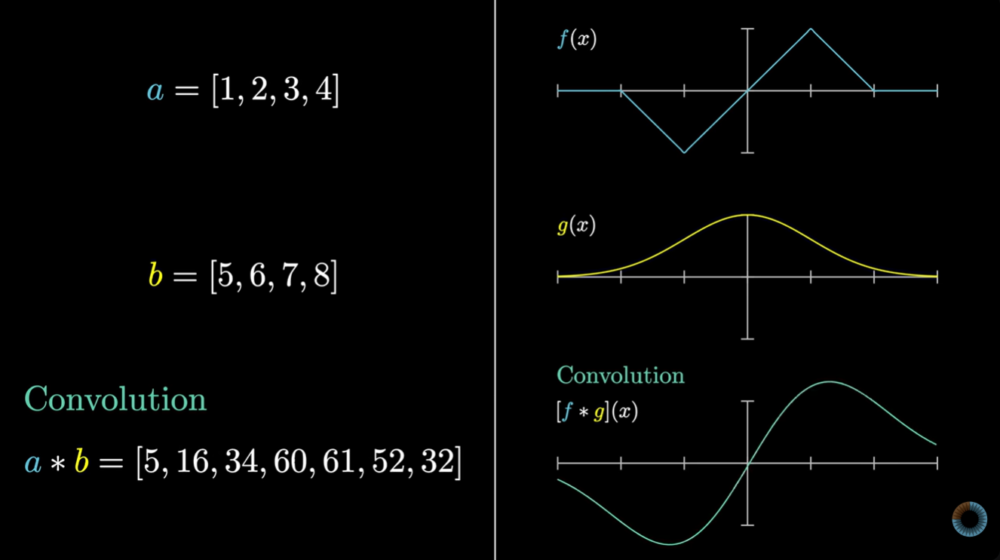

### Image Processing
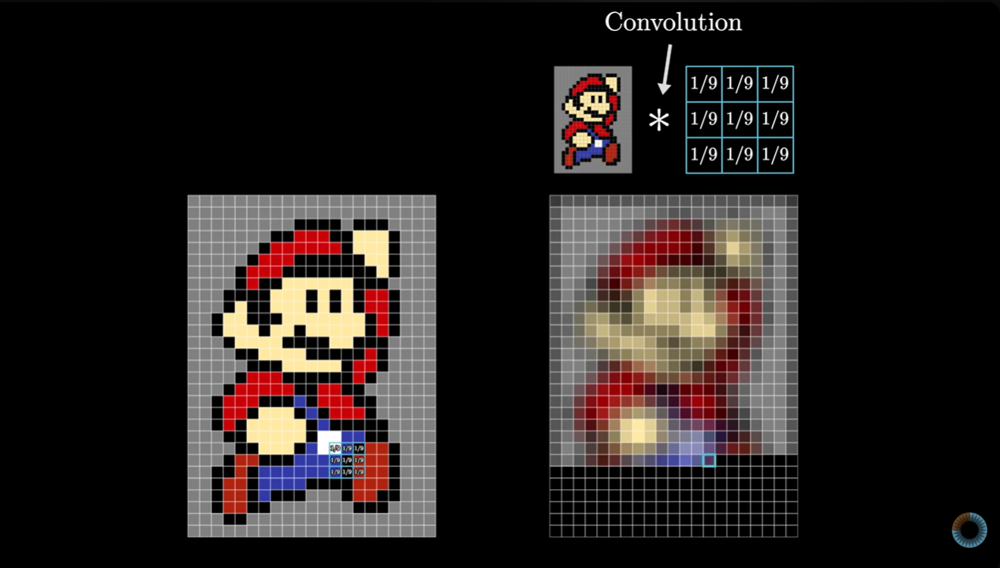

### How look kernel result
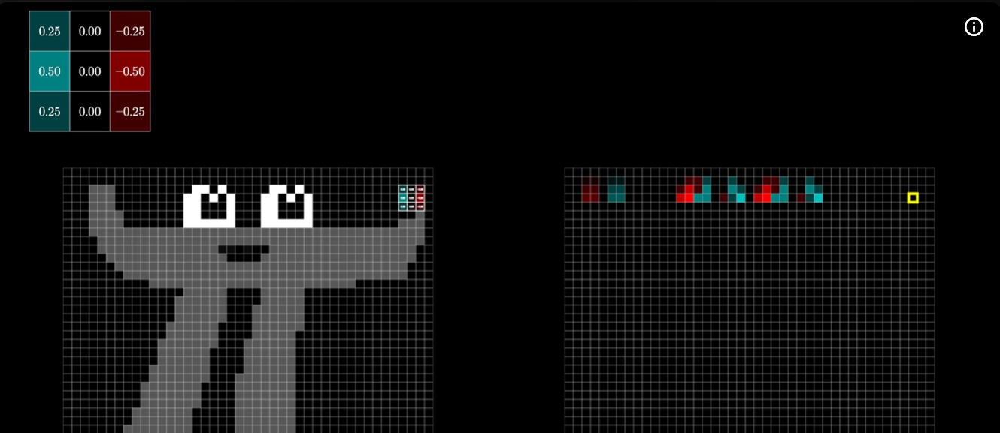

### Result of Convolution
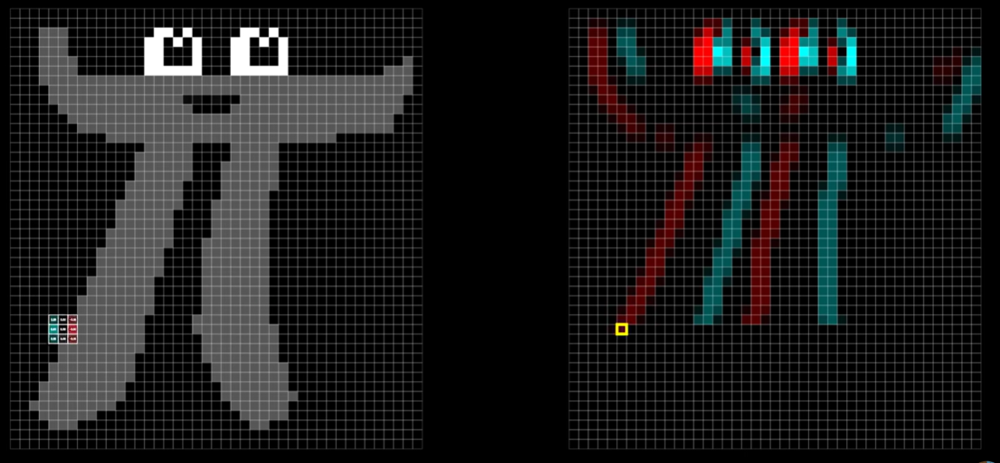


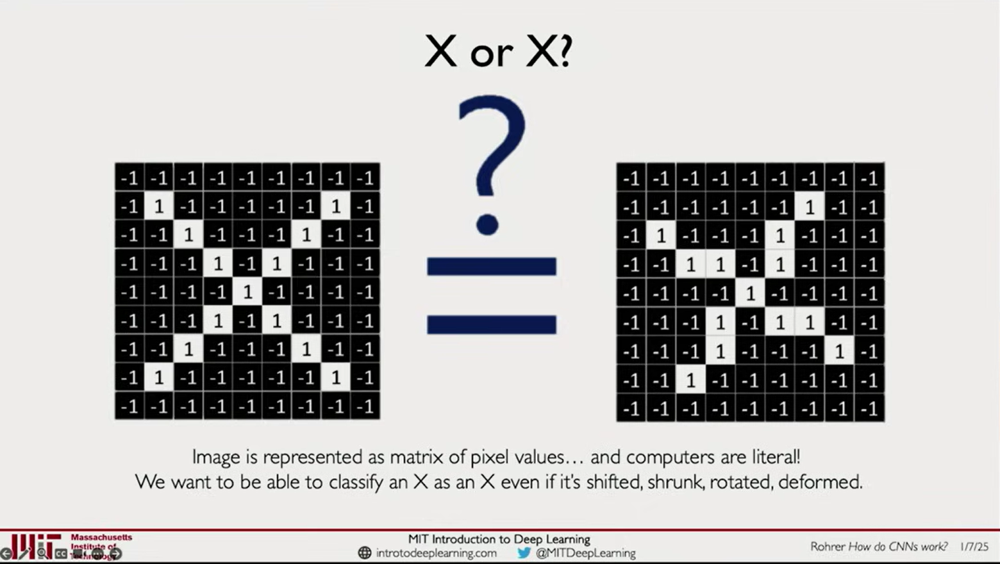

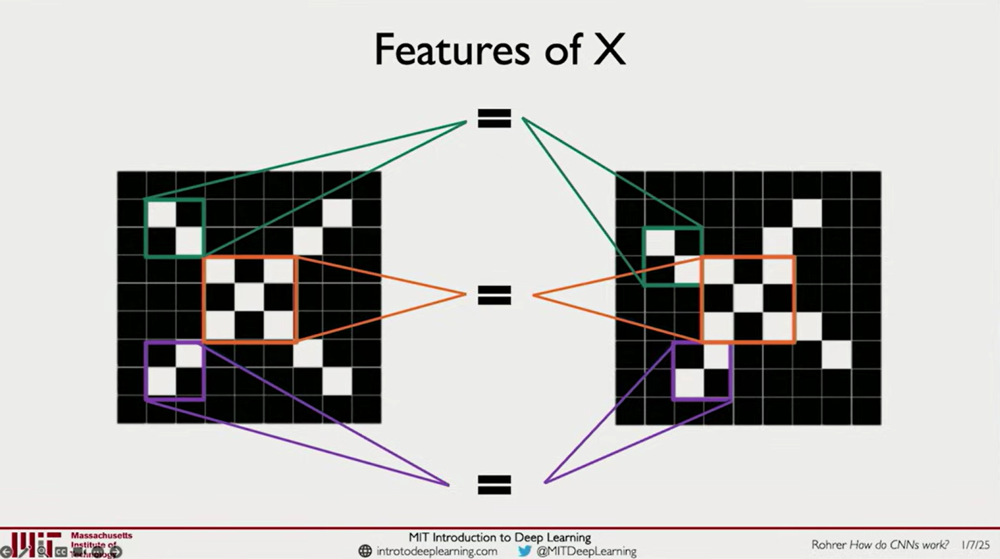

### How to look Operation
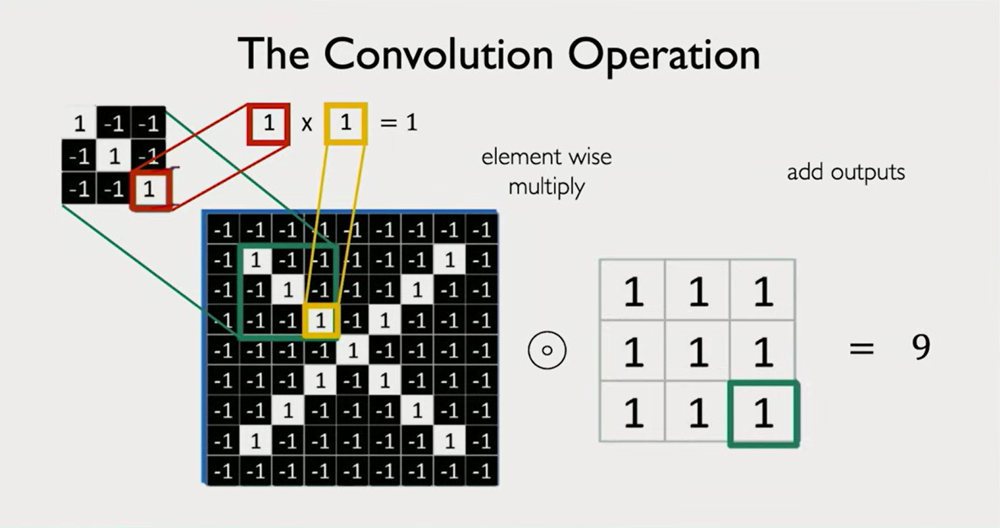

### Types of Filters 
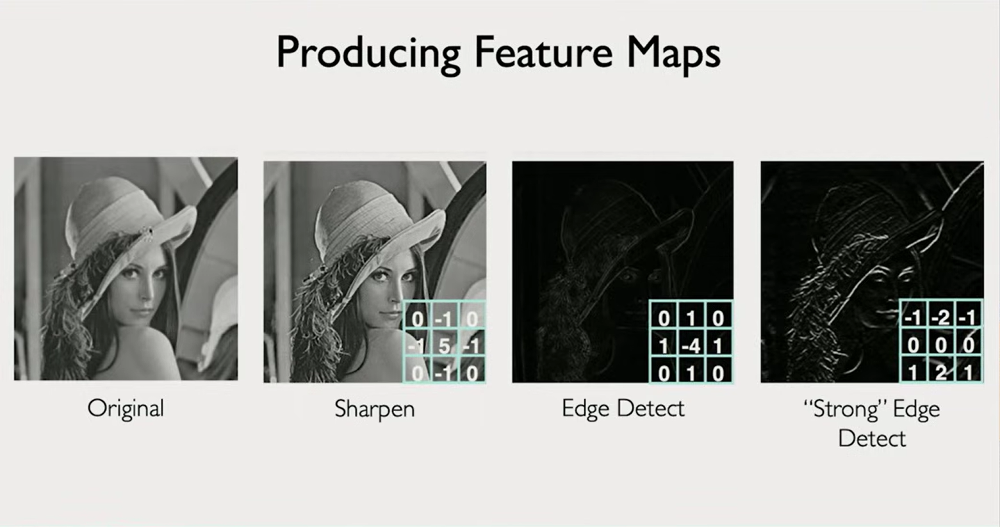

## 1. Сверткіш қабат (Convolution Layer)

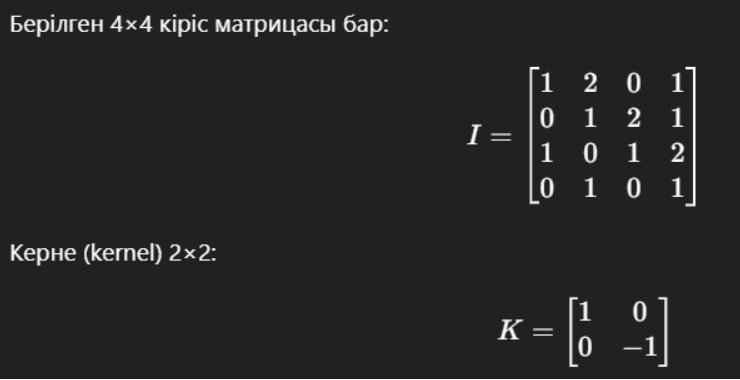

Тапсырма: Сверткіш операциясын қолданып feature map табыңыз.


Python мысалын шығарыңыз және шығыс нәтижесін көрсетіңіз.


In [30]:
import numpy as np 

I = [
    [1,2,0,1],
    [0,1,2,1],
    [1,0,1,2],
    [0,1,0,1]
]

K = [
    [1,0],
    [0,-1]
]


def conv2d(I, K):
    I = np.array(I)
    K = np.array(K)
    m, n = I.shape
    k, l = K.shape
    output = np.zeros((m-k+1, n-l+1))

    for i in range(m-k+1):
        for j in range(n-l+1):
            output[i][j] = np.sum(I[i:i+k, j:j+l] * K)  
    return output


feature_map = conv2d(I, K)
print(feature_map )

[[ 0.  0. -1.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]]


In [31]:
from spicy import signal 

signal.correlate2d(I, K, mode='valid')

array([[ 0,  0, -1],
       [ 0,  0,  0],
       [ 0,  0,  0]])

**Кросс-корреляция**: Это именно то, что мы делали «на пальцах» — просто прикладывали фильтр к картинке и считали сумму произведений. 📐

**Свертка (математическая)**: Перед тем как приложить фильтр к картинке, его нужно перевернуть на 180° (по вертикали и горизонтали). 🔄

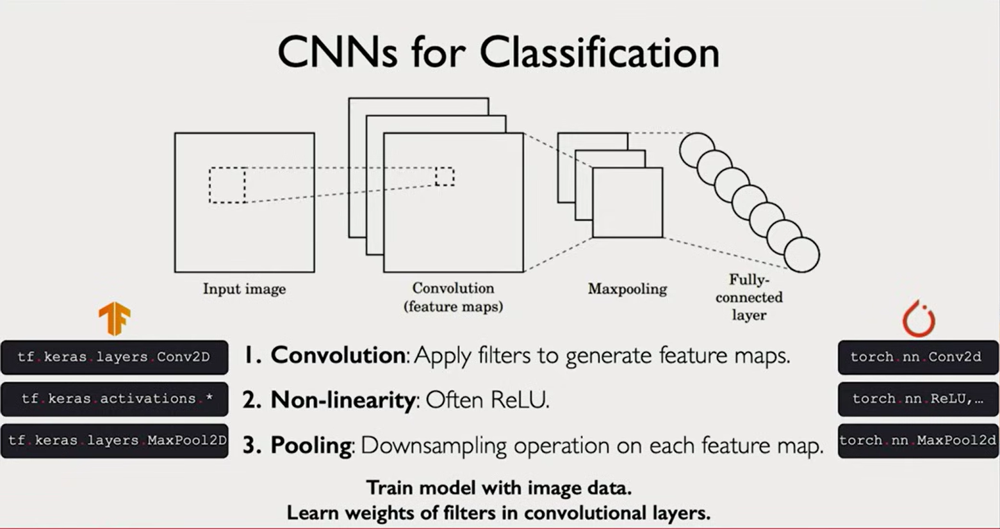

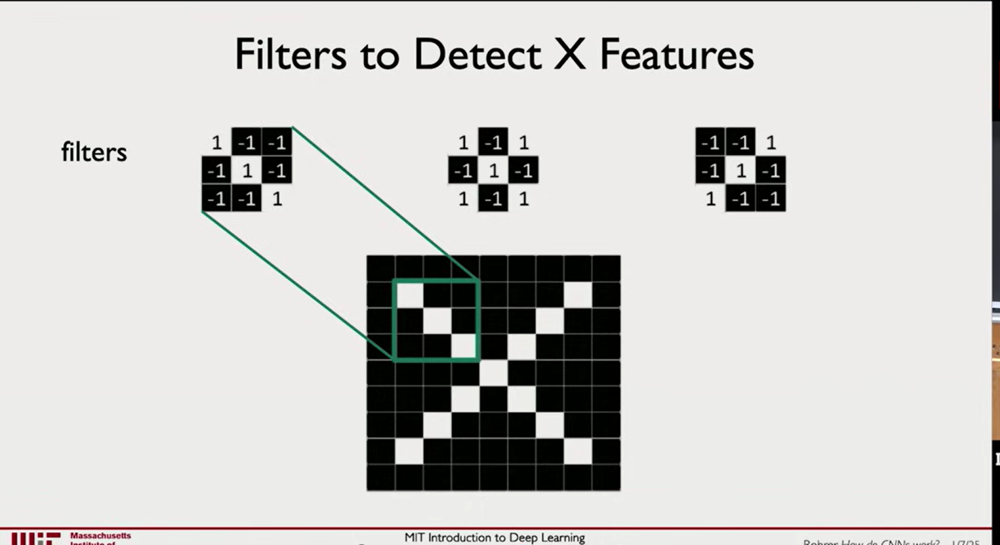



##  2. Активация функциясы

Feature map нәтижесін ReLU функциясына салыңыз:

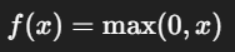

Тапсырма: Сверткіш нәтижесін ReLU арқылы өңдеңіз.


Python-да массивпен есептеңіз.




In [32]:
feature_map = np.array(feature_map)
relu_result = np.maximum(0, feature_map)
print(f"Result ReLU Activation:\n {relu_result}")

Result ReLU Activation:
 [[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]


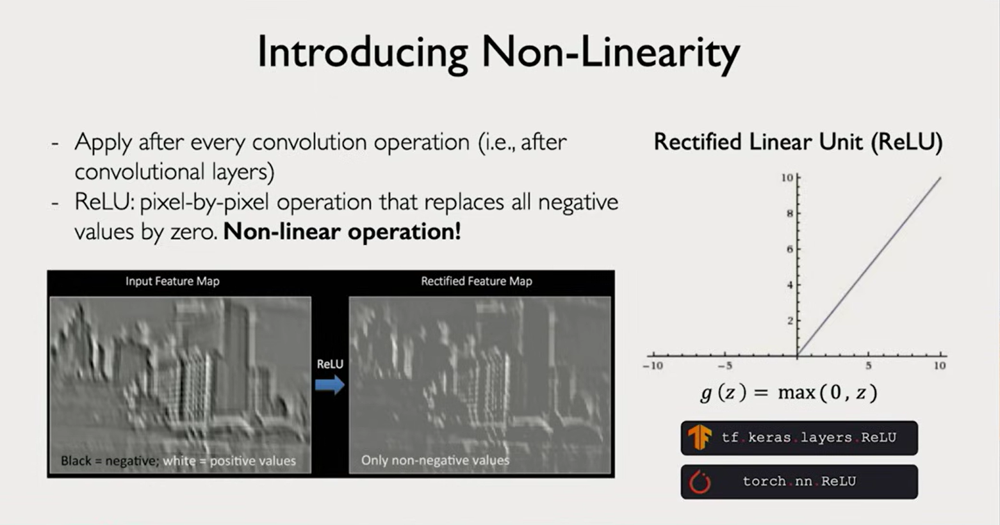

## 3. Pooling

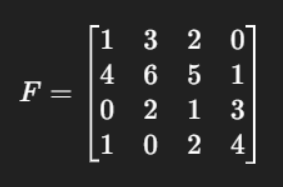

Тапсырма: 2×2 Max Pooling қолданыңыз, stride = 2


Нәтижені көрсетіңіз.


In [37]:
import tensorflow as tf 

F = [
    [1, 3, 2, 0], 
    [4, 6, 5, 1], 
    [0, 2, 1, 3], 
    [1, 0, 2, 4]
]


input_tensor = tf.constant(F, dtype=tf.float32)
input_tensor = tf.reshape(input_tensor, [1, 4, 4, 1])

output = tf.nn.max_pool2d(input_tensor, ksize=2, strides=2, padding='VALID')

print(output.numpy().reshape(2, 2))

[[6. 5.]
 [2. 4.]]


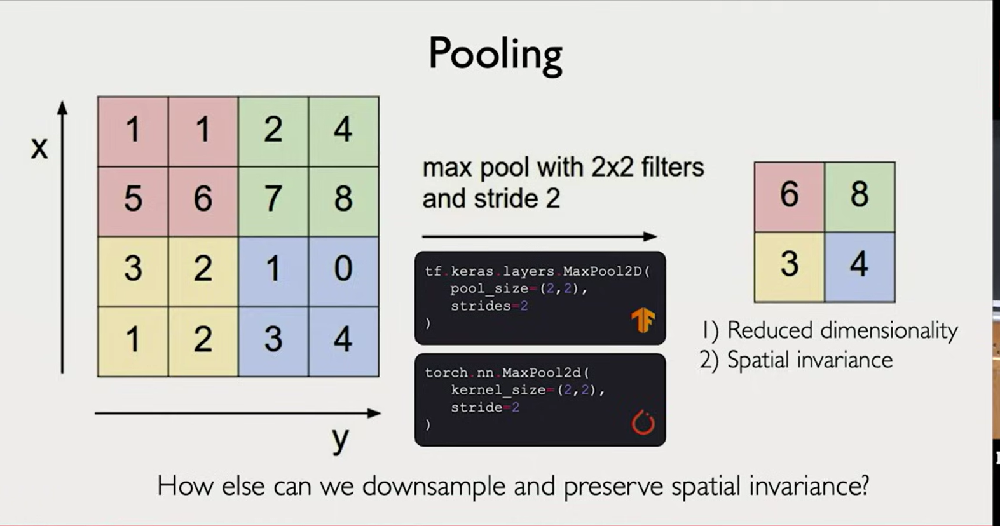

## 4. Dropout
 
Берілген feature map:

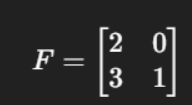

Тапсырма: Dropout қолдану (rate = 0.5)


Кездейсоқ mask генерациялап, жаңа feature map есептеңіз.




In [45]:
F = np.array([[2, 0], [3, 1]])
rate = 0.5 

mask = np.random.binomial(1, 1-rate, size=F.shape) 

dropout = F * mask 
dropout 

array([[2, 0],
       [0, 1]])

## 5. Batch Normalization

Берілген нейрон қабатының шығуы:

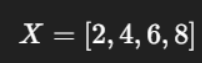

Тапсырма: Batch Normalization қолданыңыз (ε=0.01)


Қадамдарды көрсетіп есептеңіз:


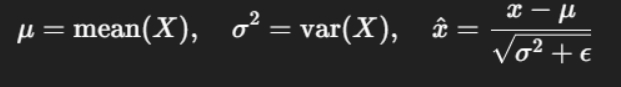

In [46]:
X = np.array([2,4,6,9])
eps = 0.01 

mu = np.mean(X)
stand = np.var(X)
normalization_value = (X - mu) / np.sqrt(stand + eps)

print(f"Среднее (mu): {mu}")
print(f"Дисперсия (var): {stand}")
print(f"Результат Batch Norm: {normalization_value}")

Среднее (mu): 5.25
Дисперсия (var): 6.6875
Результат Batch Norm: [-1.25581886 -0.48300725  0.28980435  1.44902176]


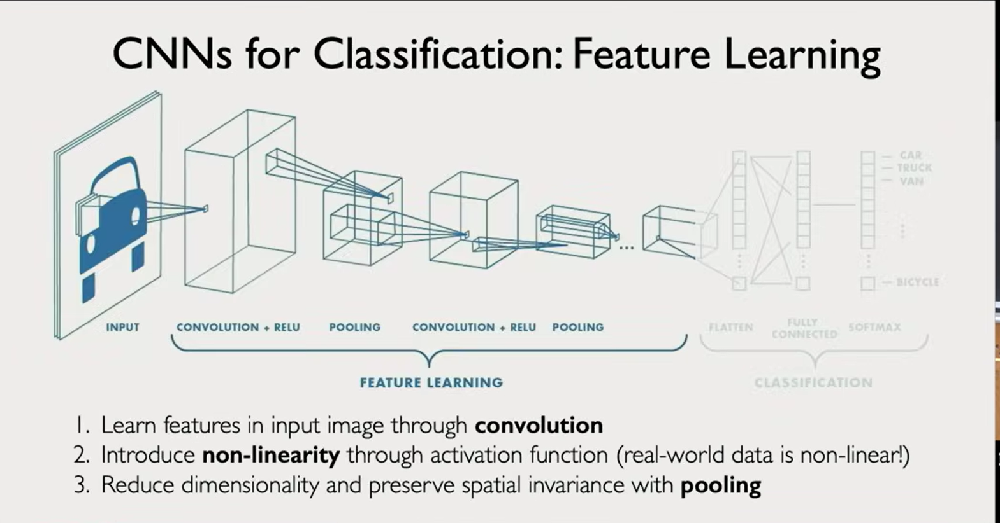

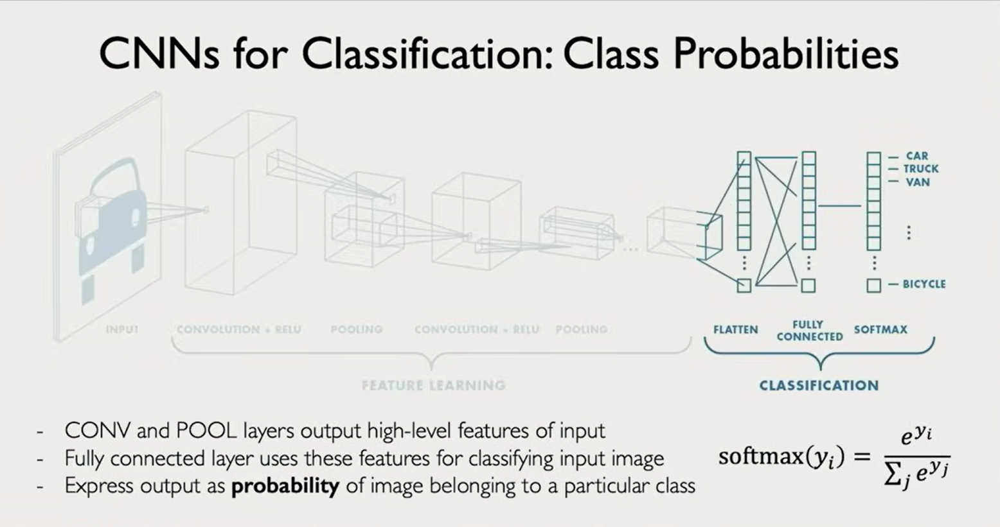

## 6. Трансферлік оқыту (Transfer Learning)

Сізде CIFAR-10 деректер жинағы бар (10 классы бар).

Тапсырма: Алдын ала оқытылған ResNet50 моделін пайдаланып соңғы 10 класты классификациялайтын модель құрыңыз.


Python Keras коды мен model.summary() нәтижесін көрсетіңіз.


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models, applications 
import matplotlib.pyplot as plt

(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()

170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 104s 1us/step
94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 64s 1us/step


In [3]:
base_model = applications.ResNet50(
    weights='imagenet',
    include_top=False, 
    input_shape=(32,32,3)
)

base_model.trainable = False 

model = models.Sequential([
    base_model, 
    layers.Flatten(),
    layers.BatchNormalization(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0,5),
    layers.Dense(10, activation='softmax')
])


model.compile(optimizer = 'adam',
              loss = 'sparse_categorical_crossentropy',
              metrics = ['accuracy']
              )

model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 1, 1, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 2048)           │         8,192 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 10)             │         2,570 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,123,018 (92.02 MB)

 Trainable params: 531,210 (2.03 MB)

 Non-trainable params: 23,591,808 (90.00 MB)

## 7. Қосымша есеп (композит)


Берілген сурет 28×28 пиксель.

3×3 керне қолдану, ReLU арқылы өткізу, Max Pooling 2×2 қолдану, Dropout rate=0.25.


Python кодын жасап, соңғы feature map өлшемін есептеңіз.
